In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('../')
sys.argv=[''] 
del sys

In [3]:
cd "/root/SymmNeRF-baseline/code"

/root/SymmNeRF-baseline/code


In [4]:
from opt import config_parser
import torch 
import numpy as np 
import matplotlib.pyplot as plt 
import setproctitle
import tqdm 
parser = config_parser()
args = parser.parse_args()

device = torch.device("cuda:0")

det = args.det
lindisp = args.lindisp
args.distributed = False
args.local_feature_ch = 512
args.local_rank = 0
args.eval_scene = 'cars'
args.eval_dataset = 'srns_dataset'
args.num_local_layers = 2
args.enforce_symmetry = {'status':False,
                         'on_coarse':False,'on_fine':False,
                         'concatenate_on_coarse':False, 'concatenate_on_fine':False}
args.no_load_opt = True
args.no_load_scheduler = True

setproctitle.setproctitle('[Gaetan - SymmNeRF Test]')

In [6]:
# Create training dataset
from torch.utils.data import DataLoader,Subset
from datasets import dataset_dict, create_training_dataset
import matplotlib.pyplot as plt 


test_dataset = dataset_dict[args.eval_dataset](args,'test',args.eval_scene)

test_idx = np.random.randint(1,len(test_dataset),200)
test_subset = Subset(test_dataset,test_idx)
test_loader = DataLoader(test_subset,batch_size = 1,shuffle = True)

[Info] Loading SRNs dataset: /data/srn_cars/cars_test


### Model weights loading. 

In [7]:
from model.model import HyperNeRFResNetSymmLocal

#### Baseline model - SymmNeRF

In [8]:
args.local_feature_ch = 1024
args.use_first_layer_as_F = False
args.no_first_pool = False
args.learnable_feature_upsampling = {'use':False,'type':None}
args.module_with_cosine = {"use":False,"G": 16}

model_baseline = HyperNeRFResNetSymmLocal(args,ckpts_folder = '/root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline/ckpts/')

[Info] Reloading from /root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline/ckpts/model_300000.pth, starting at step=300000


#### Baseline model - SymmNeR with Cosine Mod.

In [9]:
args.local_feature_ch = 1024
args.use_first_layer_as_F = False
args.no_first_pool = False
args.learnable_feature_upsampling = {'use':False,'type':None}
args.module_with_cosine = {"use":True,"G": 16}

model_cosine = HyperNeRFResNetSymmLocal(args,ckpts_folder = '/root/SymmNeRF-baseline/logs/srns_dataset/cars/cosine_simmilarity/ckpts/')

[Info] Reloading from /root/SymmNeRF-baseline/logs/srns_dataset/cars/cosine_simmilarity/ckpts/model_300000.pth, starting at step=300000


#### SymmNeRF model -Feature 64x64x64

In [8]:
args.local_feature_ch = 128
args.use_first_layer_as_F = True
args.no_first_pool = True
args.learnable_feature_upsampling = {'use':False,'type':None}

model_F64 = HyperNeRFResNetSymmLocal(args,ckpts_folder = '/root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline_light_64/ckpts/')

[Info] Reloading from /root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline_light_64/ckpts/model_500000.pth, starting at step=500000


#### SymmNeRF model - Feature 32x32x64

In [9]:
args.local_feature_ch = 128
args.use_first_layer_as_F = True
args.no_first_pool = False
args.learnable_feature_upsampling = {'use':False,'naive_concat':False}

model_F32 = HyperNeRFResNetSymmLocal(args,ckpts_folder = '/root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline_light/ckpts')

[Info] Reloading from /root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline_light/ckpts/model_500000.pth, starting at step=500000


#### SymmNeRF model - Learnable Upsampling layers - 128x128x128

In [10]:
args.local_feature_ch = 256
args.use_first_layer_as_F = False
args.no_first_pool = False
args.learnable_feature_upsampling = {'use':True,'type':'concat_smart1'}

model_F_LearnUp = HyperNeRFResNetSymmLocal(args,ckpts_folder = '/root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline_learnableF/ckpts')

[Info] Reloading from /root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline_learnableF/ckpts/model_500000.pth, starting at step=500000


#### SymmNeRF model - Learnable Upsampling layers - 64x64x512

In [13]:
args.local_feature_ch = 1024
args.use_first_layer_as_F = False
args.no_first_pool = False
args.learnable_feature_upsampling = {'use':True,'type':'naive_concat'}

model_F_LearnUpNaive = HyperNeRFResNetSymmLocal(args,ckpts_folder = '/root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline_learnableFOriginal/ckpts')

[Info] Reloading from /root/SymmNeRF-baseline/logs/srns_dataset/cars/baseline_learnableFOriginal/ckpts/model_490000.pth, starting at step=490000


In [10]:
from model.sample_ray import RaySampler
from evaluation.eval_benchmark import pred_single_image
from skimage import metrics
import lpips
from utils.general import *
import numpy as np 

In [ ]:
# Data to overfit on.
it = iter(test_loader)
test_data = next(it)

# Load training rays
ray_sampler = RaySampler(test_data)

In [11]:
# LPIPS metrics
lpips_vgg = lpips.LPIPS(net='vgg').to(device)

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.9/dist-packages/lpips/weights/v0.1/vgg.pth


In [12]:
idx_for_visuals = np.random.randint(0,200,50)
print(f'Selected indexes for visuals: {idx_for_visuals}')

Selected indexes for visuals: [ 58  27  94 186  27  38  92 150  77 179 188 162 128  56  51 176 182  64
  71 195  30  24  61 120  45  21 124  11 136  20 177  68  47  90  23   3
  86 140  36  49 144  19  67   6 189  32 133 103 199  24]


In [19]:
import torch 
print(torch.__version__)

1.11.0+cu113


In [14]:
dict_res = {'baseline':{'psnr':[],'ssim':[],'lpips':[],'img_pred':[]},
            'light_F32':{'psnr':[],'ssim':[],'lpips':[],'img_pred':[]},
            'light_F64':{'psnr':[],'ssim':[],'lpips':[],'img_pred':[]},
            'F_LearnUp':{'psnr':[],'ssim':[],'lpips':[],'img_pred':[]},
            'F_LearnUpOriginal':{'psnr':[],'ssim':[],'lpips':[],'img_pred':[]},
            'baseline_modulation':{'psnr':[],'ssim':[],'lpips':[],'img_pred':[]},
            'Is':[],
            'It':[]
           }
            
for i,test_data in enumerate(tqdm.tqdm(test_loader)):
    # Load training rays
    ray_sampler = RaySampler(test_data)
    
    render_list = list(range(ray_sampler.render_imgs[0].shape[0]))
    render_list.remove(ray_sampler.src_view[0])

    render_views = np.random.choice(render_list, 3)

    for render_view in render_views: 
        
        ###########
        ## Baseline
        args.local_feature_ch =1024
        args.use_first_layer_as_F = False
        args.no_first_pool = False
        args.learnable_feature_upsampling = {'use':False,'type':None}
        args.module_with_cosine = {"use":False,"G": 16}
        Ipred1 = pred_single_image(args,model_baseline,device,ray_sampler,render_view)
        Ipred1_np =Ipred1.numpy()
        
        ###########
        ## Baseline
        args.module_with_cosine = {"use":True,"G": 16}
        Ipred6 = pred_single_image(args,model_cosine,device,ray_sampler,render_view)
        Ipred6_np =Ipred6.numpy()
        
        
        
        
        '''
        ##############################
        ## SymmNeRF - Feature 32x32x64
        args.local_feature_ch =128
        args.use_first_layer_as_F = True
        args.no_first_pool = False
        args.learnable_feature_upsampling = {'use':False,'type':None}
        
        Ipred2 = pred_single_image(args,model_F32,device,ray_sampler,render_view)
        Ipred2_np =Ipred2.numpy()
        
        ##############################
        ## SymmNeRF - Feature 64x64x64
        args.local_feature_ch =128
        args.use_first_layer_as_F = True
        args.no_first_pool = True
        args.learnable_feature_upsampling = {'use':False,'type':None}
        
        Ipred3 = pred_single_image(args,model_F64,device,ray_sampler,render_view)
        Ipred3_np =Ipred3.numpy()
        
        #################################
        ## SymmNeRF - Feature 128x128x128
        args.local_feature_ch = 256
        args.learnable_feature_upsampling = {'use':True,'type':'concat_smart1'}
        args.use_first_layer_as_F = False
        args.no_first_pool = False
        
        Ipred4 = pred_single_image(args,model_F_LearnUp,device,ray_sampler,render_view)
        Ipred4_np =Ipred4.numpy()
        
        #################################
        ## SymmNeRF - Feature 64x64x512
        args.local_feature_ch = 1024
        args.learnable_feature_upsampling = {'use':True,'type':'naive_concat'}
        args.use_first_layer_as_F = False
        args.no_first_pool = False
        
        Ipred5 = pred_single_image(args,model_F_LearnUpNaive,device,ray_sampler,render_view)
        Ipred5_np =Ipred5.numpy()
        
        '''
        ##########################
        # Source and target images. 
        It = ray_sampler.render_imgs[0][render_view].permute(1, 2, 0).cpu()
        It_np = It.numpy()
        Is = ray_sampler.render_imgs[0][ray_sampler.src_view[0]].permute(1,2,0)
        Is_np = Is.numpy()
        
        ##########
        # Metrics.
        psnr1 = metrics.peak_signal_noise_ratio(Ipred1_np,It_np)
        ssim1 = metrics.structural_similarity(Ipred1_np,It_np,channel_axis = -1,data_range = 1)
        lpips1 = lpips_vgg(Ipred1[None,...].permute(0,3,1,2).float().to(device),It[None,...].permute(0,3,1,2).float().to(device)).item()
        
        dict_res['baseline']['psnr'].append(psnr1)
        dict_res['baseline']['ssim'].append(ssim1)
        dict_res['baseline']['lpips'].append(lpips1)
        '''
        psnr2 = metrics.peak_signal_noise_ratio(Ipred2_np,It_np)
        ssim2 = metrics.structural_similarity(Ipred2_np,It_np,channel_axis = -1,data_range = 1)
        lpips2 = lpips_vgg(Ipred2[None,...].permute(0,3,1,2).float().to(device),It[None,...].permute(0,3,1,2).float().to(device)).item()
       
        dict_res['light_F32']['psnr'].append(psnr2)
        dict_res['light_F32']['ssim'].append(ssim2)
        dict_res['light_F32']['lpips'].append(lpips2)
        
        psnr3 = metrics.peak_signal_noise_ratio(Ipred3_np,It_np)
        ssim3 = metrics.structural_similarity(Ipred3_np,It_np,channel_axis = -1,data_range = 1)
        lpips3 = lpips_vgg(Ipred3[None,...].permute(0,3,1,2).float().to(device),It[None,...].permute(0,3,1,2).float().to(device)).item()
        
        dict_res['light_F64']['psnr'].append(psnr3)
        dict_res['light_F64']['ssim'].append(ssim3)
        dict_res['light_F64']['lpips'].append(lpips3)
        
        psnr4 = metrics.peak_signal_noise_ratio(Ipred4_np,It_np)
        ssim4 = metrics.structural_similarity(Ipred4_np,It_np,channel_axis = -1,data_range = 1)
        lpips4 = lpips_vgg(Ipred4[None,...].permute(0,3,1,2).float().to(device),It[None,...].permute(0,3,1,2).float().to(device)).item()
        
        dict_res['F_LearnUp']['psnr'].append(psnr4)
        dict_res['F_LearnUp']['ssim'].append(ssim4)
        dict_res['F_LearnUp']['lpips'].append(lpips4)
        
        psnr5 = metrics.peak_signal_noise_ratio(Ipred5_np,It_np)
        ssim5 = metrics.structural_similarity(Ipred5_np,It_np,channel_axis = -1,data_range = 1)
        lpips5 = lpips_vgg(Ipred5[None,...].permute(0,3,1,2).float().to(device),It[None,...].permute(0,3,1,2).float().to(device)).item()
        
        dict_res['F_LearnUpOriginal']['psnr'].append(psnr5)
        dict_res['F_LearnUpOriginal']['ssim'].append(ssim5)
        dict_res['F_LearnUpOriginal']['lpips'].append(lpips5)
        '''
        psnr6 = metrics.peak_signal_noise_ratio(Ipred6_np,It_np)
        ssim6 = metrics.structural_similarity(Ipred6_np,It_np,channel_axis = -1,data_range = 1)
        lpips6 = lpips_vgg(Ipred6[None,...].permute(0,3,1,2).float().to(device),It[None,...].permute(0,3,1,2).float().to(device)).item()
        
        dict_res['baseline_modulation']['psnr'].append(psnr6)
        dict_res['baseline_modulation']['ssim'].append(ssim6)
        dict_res['baseline_modulation']['lpips'].append(lpips6)
                
        if i in idx_for_visuals:
            
            dict_res['baseline']['img_pred'].append(Ipred1_np)
            #dict_res['light_F32']['img_pred'].append(Ipred2_np)
            #dict_res['light_F64']['img_pred'].append(Ipred3_np)
            #dict_res['F_LearnUp']['img_pred'].append(Ipred4_np)
            #dict_res['F_LearnUpOriginal']['img_pred'].append(Ipred5_np)
            dict_res['baseline_modulation']['img_pred'].append(Ipred6_np)
            dict_res['Is'].append(Is_np)
            dict_res['It'].append(It_np)

100%|██████████| 200/200 [1:54:58<00:00, 34.49s/it]


In [15]:
baseline_psnr = np.mean(dict_res['baseline']['psnr'])
baseline_ssim = np.mean(dict_res['baseline']['ssim'])
baseline_lpips = np.mean(dict_res['baseline']['lpips'])

'''
light_F32_psnr = np.mean(dict_res['light_F32']['psnr'])
light_F32_ssim = np.mean(dict_res['light_F32']['ssim'])
light_F32_lpips = np.mean(dict_res['light_F32']['lpips'])

light_F64_psnr = np.mean(dict_res['light_F64']['psnr'])
light_F64_ssim = np.mean(dict_res['light_F64']['ssim'])
light_F64_lpips = np.mean(dict_res['light_F64']['lpips'])

FLearnUp_psnr = np.mean(dict_res['F_LearnUp']['psnr'])
FLearnUp_ssim = np.mean(dict_res['F_LearnUp']['ssim'])
FLearnUp_lpips = np.mean(dict_res['F_LearnUp']['lpips'])

F_LearnUpOriginal_psnr = np.mean(dict_res['F_LearnUpOriginal']['psnr'])
F_LearnUpOriginal_ssim = np.mean(dict_res['F_LearnUpOriginal']['ssim'])
F_LearnUpOriginal_lpips = np.mean(dict_res['F_LearnUpOriginal']['lpips'])
'''
baseline_cosine_psnr = np.mean(dict_res['baseline_modulation']['psnr'])
baseline_cosine__ssim = np.mean(dict_res['baseline_modulation']['ssim'])
baseline_cosine__lpips = np.mean(dict_res['baseline_modulation']['lpips'])



In [16]:
print(baseline_psnr,baseline_cosine_psnr)
print(baseline_ssim,baseline_cosine__ssim)
print(baseline_lpips,baseline_cosine__lpips)

22.732465205276732 22.81386187801528
0.8964599 0.8980631
0.10386973530364534 0.10232090609458586


In [26]:
dict_res['F_LearnUp']['psnr'] #= dict_res['F_LearnUp']['psnr'].remove(np.inf)
dict_res['F_LearnUpOriginal']['psnr'] #= dict_res['F_LearnUpOriginal']['psnr'].remove(np.inf)
print(dict_res['F_LearnUpOriginal']['psnr'])

None


In [44]:
psnr_baseline = dict_res['baseline']['psnr']
psnr_baseline=np.mean(psnr_baseline)
psnr_light32 = dict_res['light_F32']['psnr']
psnr_light32 = np.mean(psnr_light32)#.remove(np.inf)
psnr_FlearnUp= np.mean(dict_res['F_LearnUp']['psnr'])
psnr_FlearnUpOri = dict_res['F_LearnUpOriginal']['psnr']
#psnr_FlearnUpOri.remove(np.inf)
psnr_FlearnUpOri = np.mean(psnr_FlearnUpOri)


print(psnr_FlearnUp)
print(psnr_FlearnUpOri)#.remove(np.inf))
#print(dict_res['F_LearnUp']['psnr'])
#psnr_baseline_without_nan = psnr_baseline.remove(np.nan)

22.697531437583574
22.813675223995755


In [38]:
print(f''' ===================================================================================================================================
psnr baseline: {baseline_psnr:.2f}dB, psnr light F32: {light_F32_psnr:.2f}dB, psnr light F64: {light_F64_psnr:.2f}dB, psnr F LearnUp: {FLearnUp_psnr:.2f}dB, psnr F LearUpConcatNaive: {F_LearnUpOriginal_psnr:.2f}dB
ssim baseline: {baseline_ssim:.3f}, ssim light F32: {light_F32_ssim:.3f}, ssim light F64: {light_F64_ssim:.3f}, ssim F LearnUp: {FLearnUp_ssim:.3f},ssim F LearUpConcatNaive: {F_LearnUpOriginal_ssim:.3f}
lpips baseline: {baseline_lpips:.3f}, lpips light F32: {light_F32_lpips:.3f}, lpips light F64: {light_F64_lpips:.3f}, lpips F LearnUp: {FLearnUp_lpips:.3f}, ,lpips F LearUpConcatNaive: {F_LearnUpOriginal_lpips:.3f}
====================================================================================================================================''')

psnr baseline: 22.99dB, psnr light F32: 21.75dB, psnr light F64: 22.65dB, psnr F LearnUp: 22.93dB, psnr F LearUpConcatNaive: 23.12dB
ssim baseline: 0.900, ssim light F32: 0.876, ssim light F64: 0.893, ssim F LearnUp: 0.897,ssim F LearUpConcatNaive: 0.902
lpips baseline: 0.103, lpips light F32: 0.135, lpips light F64: 0.110, lpips F LearnUp: 0.108, ,lpips F LearUpConcatNaive: 0.100


In [47]:
print(len(dict_res['It']))
print(len(dict_res['Is']))
print(len(dict_res['light_F64']['img_pred']))
print(len(idx_for_visuals))

270
270
270
100


/tmp/ipykernel_384/3437702974.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7) = plt.subplots(1, 7, figsize=(25, 10))


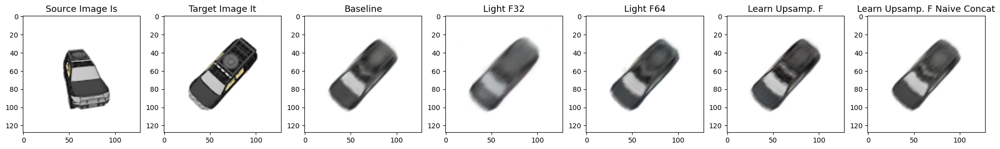

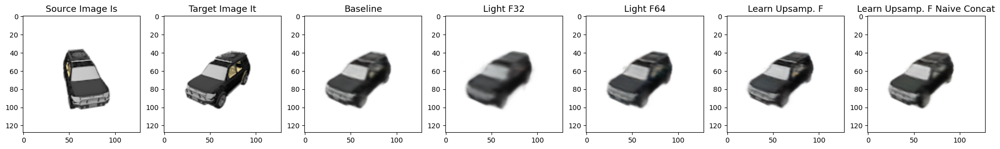

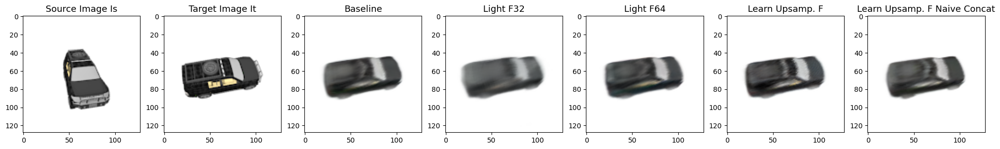

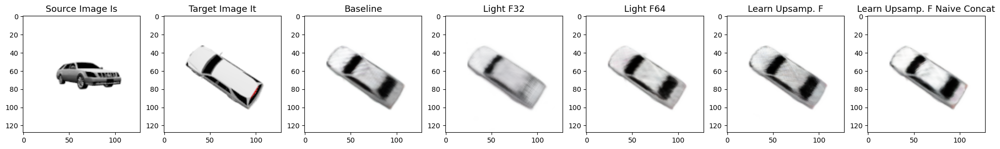

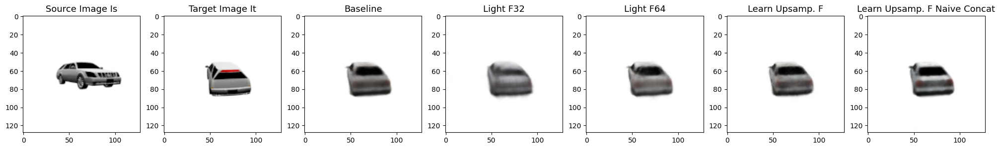

...

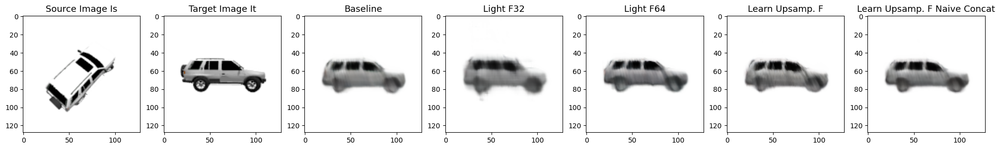

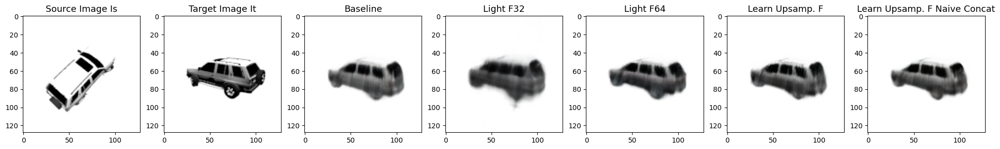

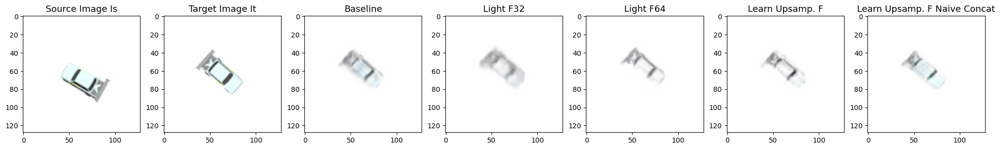

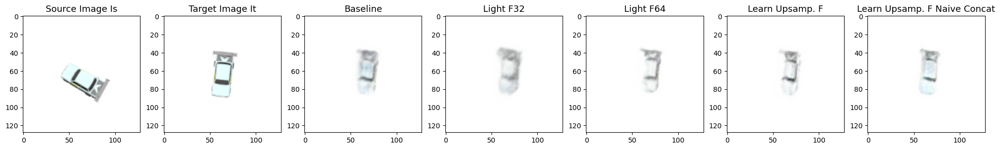

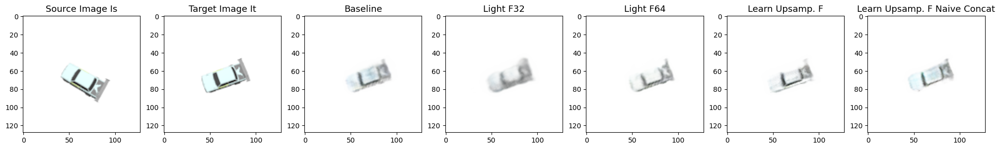

In [39]:
for i in range(75):
    fig, (ax1, ax2,ax3,ax4,ax5,ax6,ax7) = plt.subplots(1, 7, figsize=(25, 10))

    It = dict_res['It'][i]
    Is = dict_res['Is'][i]
    
    Ipred1 = dict_res['baseline']['img_pred'][i]
    Ipred2 = dict_res['light_F32']['img_pred'][i]
    Ipred3 = dict_res['light_F64']['img_pred'][i]
    Ipred4 = dict_res['F_LearnUp']['img_pred'][i]
    Ipred5 = dict_res['F_LearnUpOriginal']['img_pred'][i]
        
    
    ax1.imshow(Is)
    ax2.imshow(It)
    ax3.imshow(Ipred1)
    ax4.imshow(Ipred2)
    ax5.imshow(Ipred3)
    ax6.imshow(Ipred4)
    ax7.imshow(Ipred5)
    
    ax1.set_title('Source Image Is', fontsize=13)
    ax2.set_title('Target Image It', fontsize=13)
    ax3.set_title('Baseline',fontsize=13)
    ax4.set_title('Light F32',fontsize=13)
    ax5.set_title('Light F64',fontsize=13)
    ax6.set_title('Learn Upsamp. F',fontsize=13)
    ax7.set_title('Learn Upsamp. F Naive Concat',fontsize=13)
   